<h2>below code uses wrapper for inference (initializes model every call)</h2><br><h3>
below cell imports dependencies</h3>

<h3>switch of internet now</h3>

In [15]:
import time
import cv2
import tempfile
import base64
import numpy as np
import json
import os

In [16]:
import time
import cv2
import tempfile
import base64
import numpy as np
import json
import os

from IPython.display import Image as im
from IPython.display import display as dis
from PIL import Image

os.environ["MODEL_DIR"] = os.path.join(os.getcwd(), 'model_files/')

def visualize_tempjson():
    if os.path.exists("temp.json"):
        with open("temp.json", 'r') as rf:
            json_obj = json.load(rf)
        im64 = json_obj["data"][0].split('data:image/png;base64,')[-1]
        with tempfile.NamedTemporaryFile(delete=False) as jpg_file:
                jpg_file.write(base64.b64decode(im64))
                raw_img = Image.open(jpg_file.name)
                image = raw_img.convert("RGB")
                np_img = np.array(image)[:, :, [2, 1, 0]]
                cv2.imwrite("temp.jpg",np_img)
                dis(im("temp.jpg"))

save visualization : True
/opt/conda/lib/python3.7/site-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  /opt/conda/conda-bld/pytorch_1634272168290/work/aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
final text_encoder_type: bert-base-uncased
Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertModel: ['cls.seq_relationship.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.dense.bias']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTrain

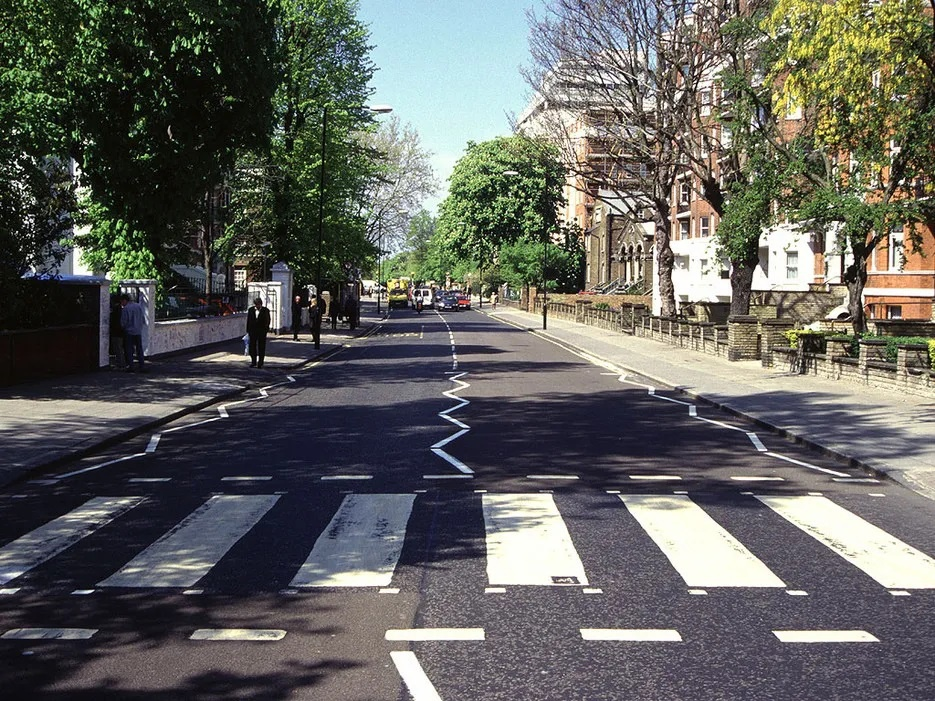

In [20]:
im_path = "/app/images/messy_road_img.jpg"
prompt = "cars"
confidence = "0.6" #optional
# use --save_visualization for saving the output
# use --get_json to save json containing image_output in base64 format
# use --print_output to print the results ( json object )

!python gdino.py "$im_path" "$prompt" "$confidence" --save_visualization --get_json

visualize_tempjson()

In [ ]:
import glob

In [21]:
while(True):
    image_list = glob.glob("images/*")
    image_options = dict(zip(range(1, len(image_list)), image_list))
    image_option = input(f"press a character to chose an image to do inference on : \n\n{image_options}")
    image_path = image_list[image_option]
    print(f"\image chosen : {image_path}")

    
    prompt = input("\n enter the prompt as a string :\t")
    print(f"prompt entered '{prompt}'")
    
    confidence_thresh = input("\nenter confidence as a float value between 0-1:\t")
    print(f"confidence entered '{confidence_thresh}'")

    img = cv2.imread(image_path)

KeyboardInterrupt: Interrupted by user

<hr>
<h1> Use below code to avoid initializing the class again </h1>

<h3> run the below cell once to initialize the model for further usage</h3>

In [17]:
import time
import cv2
import tempfile
import base64
import numpy as np
import json
import os
import glob

from utils.b64 import convert_to_base64
from IPython.display import Image as im
from IPython.display import display as dis
from PIL import Image
from gdino import Gdino

os.environ["MODEL_DIR"] = os.path.join(os.getcwd(), 'model_files/')
    
def inference(image_path, prompt, confidence, save_visualization):
    payload = {
            "image_base64": image_path,
            "image_path" : image_path,
            "prompt": prompt,
            "confidence": confidence,
            "save_visualization": save_visualization
        }

    payload["image_base64"] = convert_to_base64(payload["image_base64"])    

    start_time = time.time()
    json_obj = model.predict_raw(payload)
    end_time = time.time()

    print(f"time taken for prediction of {image_path} is {end_time - start_time} secs")

    im64 = json_obj["data"][0].split('data:image/png;base64,')[-1]
    with tempfile.NamedTemporaryFile(delete=False) as jpg_file:
        jpg_file.write(base64.b64decode(im64))
        raw_img = Image.open(jpg_file.name)
        image = raw_img.convert("RGB")
        np_img = np.array(image)[:, :, [2, 1, 0]]
        cv2.imwrite("temp.jpg",np_img)
        dis(im("temp.jpg"))
        
#MODEL INITIALIZATION        
model = Gdino()

ModuleNotFoundError: No module named 'groundingdino'

<h3>change the parameters as required and run the below cell for single image inference</h3>

coming in
0
files ['230620_143001_0000000009_CAM3_OK.bmp', '230620_143028_0000000010_CAM3_OK.bmp', '230620_143039_0000000011_CAM3_OK.bmp', '230620_143049_0000000012_CAM3_OK.bmp', '230620_143104_0000000013_CAM3_OK.bmp'], 
 root /mnt/d/projects/hoyalense/images/Black_Dot_Backlight/
#######
doing inference


/mnt/d/projects/hoyalense/environments/gdino_test/lib/python3.9/site-packages/transformers/modeling_utils.py:884: FutureWarning: The `device` argument is deprecated and will be removed in v5 of Transformers.
  warnings.warn(
/mnt/d/projects/hoyalense/environments/gdino_test/lib/python3.9/site-packages/torch/utils/checkpoint.py:31: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn("None of the inputs have requires_grad=True. Gradients will be None")


time taken for prediction of /mnt/d/projects/hoyalense/images/Black_Dot_Backlight/230620_143001_0000000009_CAM3_OK.bmp is 18.51580286026001 secs


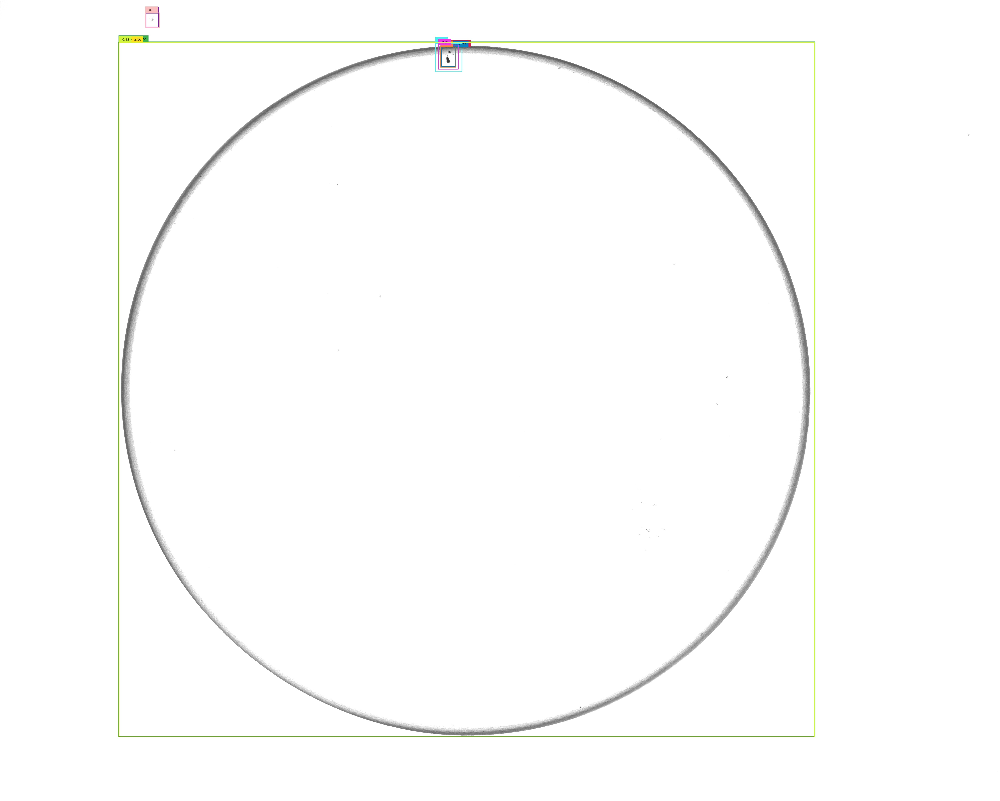

doing inference
time taken for prediction of /mnt/d/projects/hoyalense/images/Black_Dot_Backlight/230620_143028_0000000010_CAM3_OK.bmp is 19.902332067489624 secs


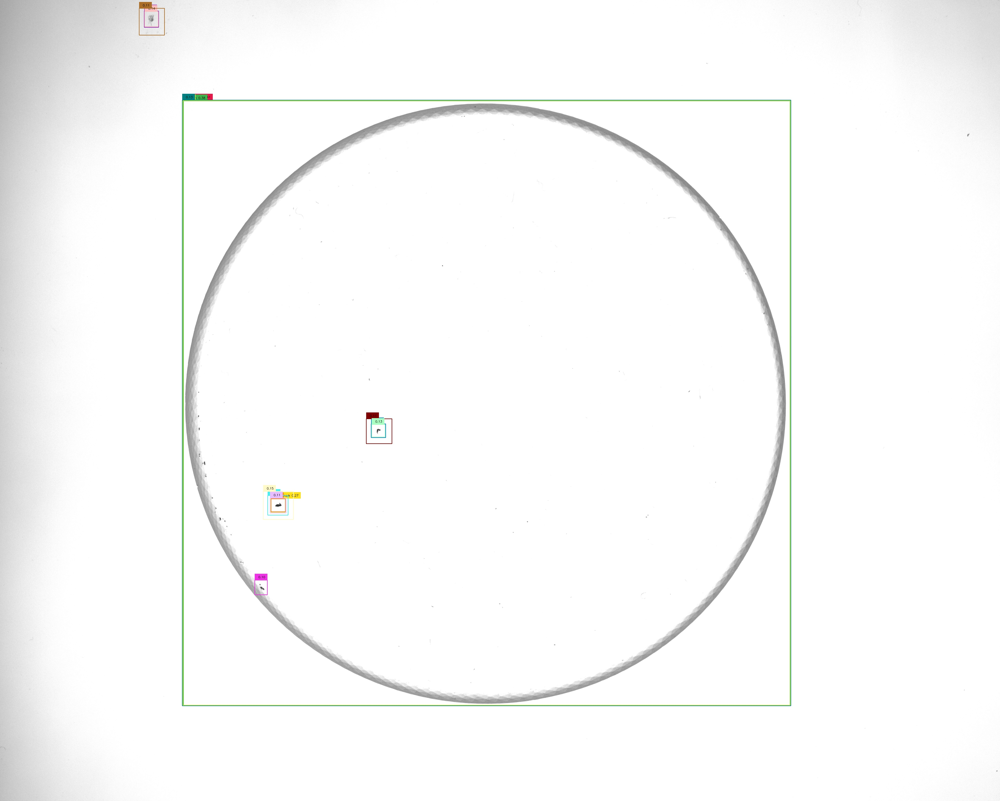

doing inference
time taken for prediction of /mnt/d/projects/hoyalense/images/Black_Dot_Backlight/230620_143039_0000000011_CAM3_OK.bmp is 19.478566884994507 secs


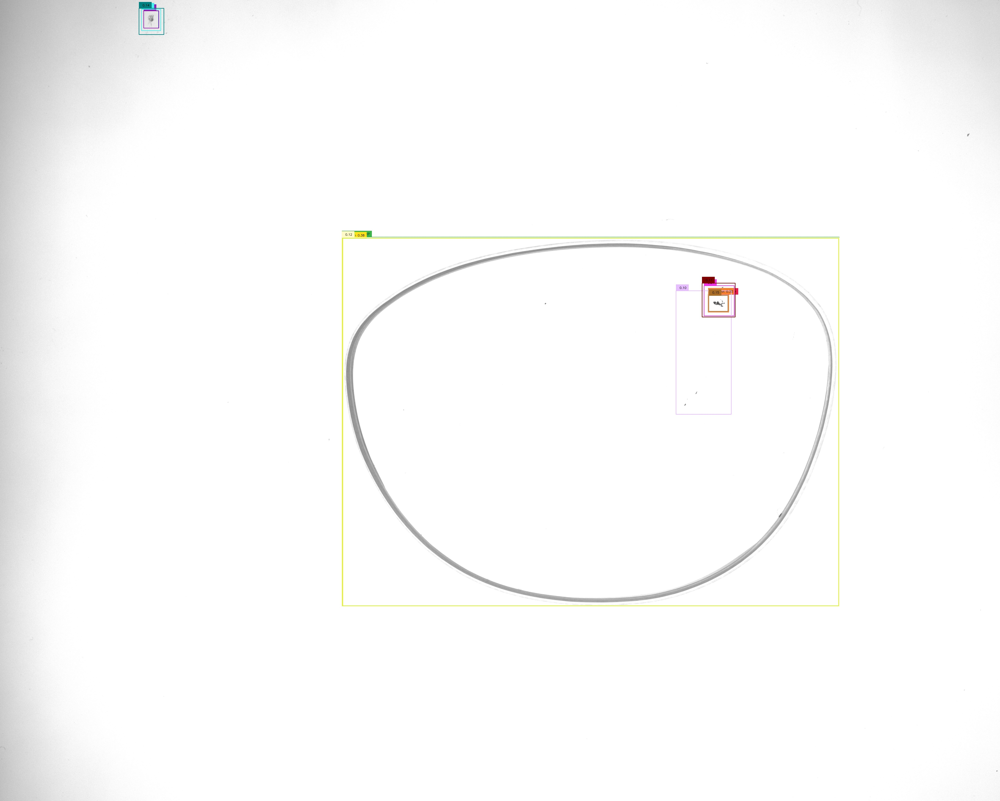

doing inference
time taken for prediction of /mnt/d/projects/hoyalense/images/Black_Dot_Backlight/230620_143049_0000000012_CAM3_OK.bmp is 19.947734594345093 secs


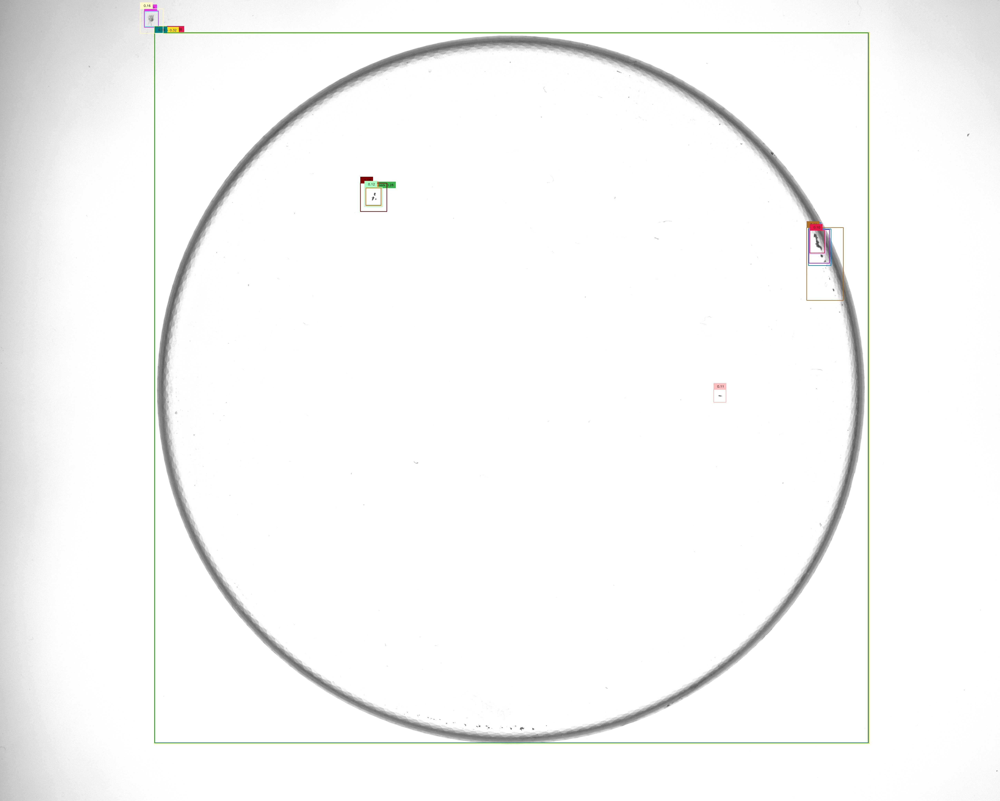

doing inference
time taken for prediction of /mnt/d/projects/hoyalense/images/Black_Dot_Backlight/230620_143104_0000000013_CAM3_OK.bmp is 20.133319854736328 secs


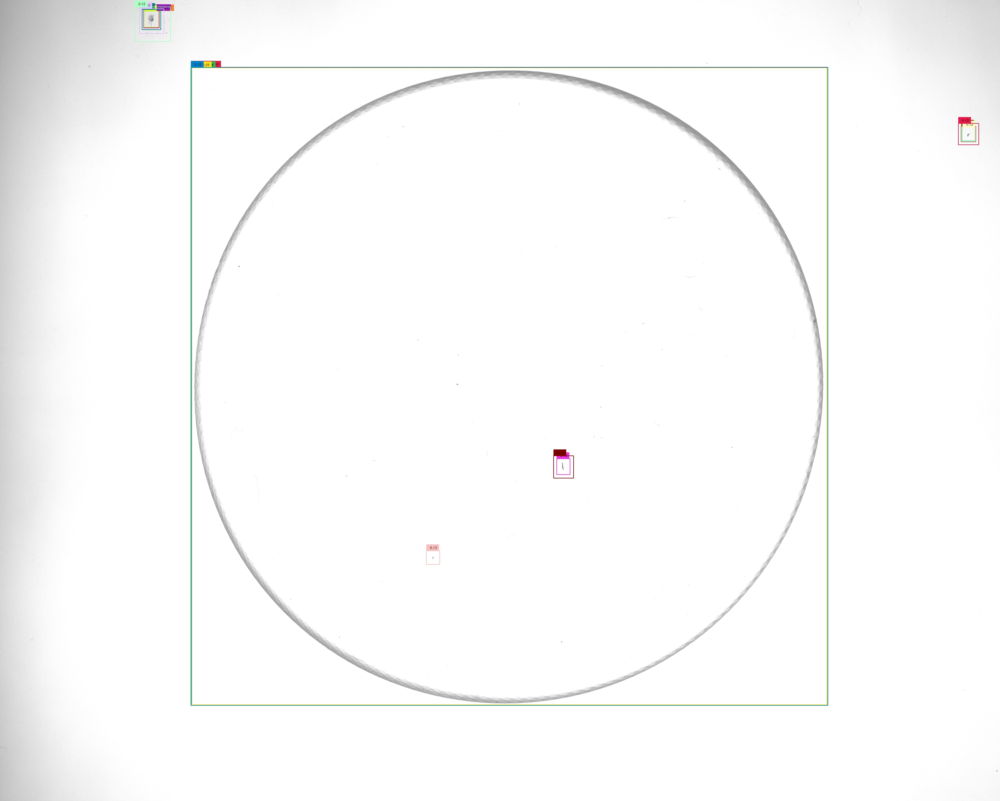

In [15]:
######-- change the parameters here --#######
pred_path = "images/Black_Dot_Backlight/"  #image path or folder of images (content must have only images)
prompt = "black mark, black dot, scratch"
confidence = '0.1' #pass as string
save_visualization = True
##############################################

if os.path.isdir(pred_path):
    print("coming in")
    files_total = []
    for ind, (root, subdirs, files) in enumerate(os.walk(os.path.join(os.getcwd(), pred_path))):
        print(ind)
        print(f"files {files}, \n root {root}\n#######")
        for i in files:
            files_total.append(os.path.join(root, i))

    for im_path in files_total:   
        print("doing inference")
        inference(im_path, prompt, confidence, save_visualization)
        
elif os.path.exists(pred_path):
    inference(pred_path, prompt, confidence, save_visualization)
    
else:
    print(f"{pred_path} doesent exist in {os.getcwd()}, (it should)")
    
